In [ ]:
!gdown --id 1P4bdP6nSUOqQLhGXvZ1z4z3hNncJFrCs

Downloading...
From: https://drive.google.com/uc?id=1P4bdP6nSUOqQLhGXvZ1z4z3hNncJFrCs
To: /content/bags_data.zip
61.6MB [00:01, 55.2MB/s]


In [ ]:
!unzip /content/bags_data.zip -d /content

In [ ]:
import glob
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import os
import pandas as pd


In [ ]:
images_dir = '/content/bags_data/JPEGImages/'
labels_dir = '/content/bags_data/segmentation_mask/'

image_list = glob.glob(images_dir+'*.jpg')
image_list_len = len(image_list)

# Calculating Mean and Standard Deviation for the train dataset

r_mean = g_mean = b_mean = r_std = g_std = b_std = 0

for idx in range(0, image_list_len):                        # taking channelwise mean and standard deviation of images in trainset
  image = np.array(Image.open(image_list[idx]))
  r_mean += (image[:,:,0]/255.0).mean()
  g_mean += (image[:,:,1]/255.0).mean()
  b_mean += (image[:,:,2]/255.0).mean()

  r_std  += (image[:,:,0]/255.0).std()
  g_std  += (image[:,:,1]/255.0).std()
  b_std  += (image[:,:,2]/255.0).std()

#taking mean of all mean added and then rounding it to 3 decimal digits
r_mean, g_mean, b_mean = r_mean/image_list_len, g_mean/image_list_len, b_mean/image_list_len
train_mean = (round(r_mean, 3), round(g_mean, 3), round(b_mean, 3))

r_std, g_std, b_std = r_std/image_list_len, g_std/image_list_len, b_std/image_list_len
train_std = (round(r_std, 3), round(g_std, 3), round(b_std, 3))


In [ ]:
class BagsDataset(Dataset):
  def __init__(self, root, split, transform=None):
    self.root = root
    self.transform_Images = transform
    self.ids = pd.read_csv(os.path.join(root, 'imagesets/' + split +'.txt'), header=None)
    # self.class_names = ["bg", "bag"]
    

  def __len__(self):
    return len(self.ids)

  def __getitem__(self, idx):
    img_path = os.path.join(self.root,'JPEGImages', str(self.ids.iloc[idx,0])+ ".jpg")
    mask_path = os.path.join(self.root,'segmentation_mask', str(self.ids.iloc[idx,0])+ ".png")
    
    img = Image.open(img_path)
    mask = Image.open(mask_path).resize((256, 256))
    mask = np.array(mask)

    img = self.transform_Images(img)
    mask = torch.from_numpy(mask)
    
    return img, mask
    

In [ ]:
transform = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor(), transforms.Normalize(train_mean, train_std)])

In [ ]:
dataset_train = BagsDataset(root='/content/bags_data', split='train', transform = transform)
train_dataloader = DataLoader(dataset_train, batch_size=8, shuffle=True, num_workers=2)

dataset_val = BagsDataset(root='/content/bags_data', split='val', transform=transform)
val_dataloader = DataLoader(dataset_val, batch_size=8, num_workers=2)



In [ ]:
img, msk = next(iter(train_dataloader))
img.shape
msk.shape

torch.Size([8, 256, 256])

In [ ]:
pip install torchfcn

     |████████████████████████████████| 71kB 5.6MB/s 
     |████████████████████████████████| 266kB 14.0MB/s 
  Created wheel for torchfcn: filename=torchfcn-1.9.6-cp36-none-any.whl size=135110 sha256=39a8d6f93074ce7ad1d313bdd862fb0d5544ac3383f747d6c8b691222802d452
  Stored in directory: /root/.cache/pip/wheels/37/f3/2a/046ddc2b143f655eab64927f2c612fab026fb663c2800f627a
  Created wheel for fcn: filename=fcn-6.4.17-cp36-none-any.whl size=25775 sha256=305ab5c1ec081af4907fb199c62ae97a9ed48a568be938b296725b22409981d7
  Stored in directory: /root/.cache/pip/wheels/09/fe/80/29c484aa1bd0003ed779d5eba6201f62caf3ff30be26459e25
  Created wheel for chainercv: filename=chainercv-0.13.1-cp36-cp36m-linux_x86_64.whl size=537345 sha256=93ea51454f44662dfbccf3ecb3503fea8ce103f5a798806b6923f3152b6e14f4
  Stored in directory: /root/.cache/pip/wheels/ea/10/01/e221beaa4b3d8341aa819a39ab8d4677457c79c81f521f3a94
Successfully built torchfcn fcn chainercv


In [ ]:
import torchfcn

In [ ]:
# # Loading FCN32 model architecture
# model = torchfcn.models.FCN32s(n_class=2)

# # Loading a pretrained vgg16
# vgg16 = torchfcn.models.VGG16(pretrained=True)

# # copying vgg16 parameters to FCN32
# model.copy_params_from_vgg16(vgg16)

model = torchfcn.models.FCN8s()
model.download()
model.load_state_dict(torch.load('/root/data/models/pytorch/fcn8s_from_caffe.pth'))

Downloading...
From: http://drive.google.com/uc?id=0B9P1L--7Wd2vT0FtdThWREhjNkU
To: /root/data/models/pytorch/fcn8s_from_caffe.pth
538MB [00:07, 73.1MB/s]


<All keys matched successfully>

In [ ]:
model

FCN8s(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(100, 100))
  (relu1_1): ReLU(inplace=True)
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1_2): ReLU(inplace=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_1): ReLU(inplace=True)
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_2): ReLU(inplace=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_1): ReLU(inplace=True)
  (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_2): ReLU(inplace=True)
  (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_3): ReLU(inplace=True)
  (pool3): MaxPool2d(kernel_size=2

In [ ]:
import torch.nn as nn

model.score_fr = nn.Conv2d(4096, 2, kernel_size=(1, 1), stride=(1, 1))
model.score_pool3 = nn.Conv2d(256, 2, kernel_size=(1, 1), stride=(1, 1))
model.score_pool4 = nn.Conv2d(512, 2, kernel_size=(1, 1), stride=(1, 1))
model.upscore2 = nn.ConvTranspose2d(2, 2, kernel_size=(4, 4), stride=(2, 2), bias=False)
model.upscore8 = nn.ConvTranspose2d(2, 2, kernel_size=(16, 16), stride=(8, 8), bias=False)
model.upscore_pool4 = nn.ConvTranspose2d(2, 2, kernel_size=(4, 4), stride=(2, 2), bias=False)

In [ ]:
# Not training first 10 Layers of the model

# i=1
# for parm in model.parameters():
#   if i<35:
#     parm.requires_grad = False
#   i +=1


In [ ]:
SMOOTH = 1e-6
from sklearn.metrics import jaccard_similarity_score as jsc


def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.detach().cpu()
    labels = labels.detach().cpu()
    softmax = torch.nn.Softmax(dim=1)

    outputs = softmax(outputs)
    
    outputs = outputs.argmax(dim=1)
    outputs.squeeze_()

    labels = labels.reshape(-1)
    outputs = outputs.reshape(-1)

    iou = jsc(labels, outputs)

    #print(iou)
  



    #outputs = outputs.squeeze(1)  # BATCH x 1 x H x W => BATCH x H x W
    #print(outputs.shape)
    #print(labels.shape)
    
    # intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    # union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    # iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    
    #thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return iou  # Or thresholded.mean() if you are interested in average across the batch

In [ ]:
cuda = torch.cuda.is_available()

if cuda:
  model.cuda()

epochs = 1
learning_rate = 0.008

optimizer = torch.optim.SGD(model.parameters(), lr =learning_rate, momentum=0.9 )
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=3, verbose=True)
criteria = torch.nn.CrossEntropyLoss()


for epoch in range(1, epochs+1):
  train_loss = 0
  val_loss = 0
  iou_train = 0
  iou_val = 0

  ###################
  # train the model #
  ###################

  model.train()
  for data, target in train_dataloader:
    if cuda:
      data, target = data.cuda(), target.cuda()
    optimizer.zero_grad()
    output = model(data)
    iou = iou_pytorch(output, target)
    target = target.long()
    loss = criteria(output, target)
    loss.backward()
    optimizer.step()

    iou_train += iou.item()
    train_loss += loss.item()
  
  ######################
  # Validate the model #
  ######################

  model.eval()
  for data, target in val_dataloader:
    if cuda:
      data, target = data.cuda(), target.cuda()
    output = model(data)
    iou = iou_pytorch(output, target)
    target = target.long()
    loss = criteria(output, target)

    iou_val += iou.item()
    val_loss += loss.item()

  epoch_val_loss = val_loss/len(val_dataloader)
  scheduler.step(epoch_val_loss)
  
  print(f'Epoch: {epoch}/{epochs}, Train Loss: {train_loss/len(train_dataloader)}, Train iou:{iou_train/(len(train_dataloader))}, Validation Loss:  {epoch_val_loss}, Validation iou:{iou_val/(len(val_dataloader))}')
  



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


Epoch: 1/1, Train Loss: 0.5944190720717112, Train iou:0.664476900924871, Validation Loss:  0.45720274320670534, Validation iou:0.794255256652832


In [ ]:
img, mask = next(iter(val_dataloader))
print(len(img))
image = img[0]
image = image.unsqueeze(dim=0)
image.shape

8


torch.Size([1, 3, 256, 256])

In [ ]:
def prediction(imag, modl):
  if cuda:
    imag = imag.cuda()
  output = modl(imag)
  return output

pred = prediction(image, model)
pred.cpu()

tensor([[[[-0.3189,  1.2725,  1.2279,  ...,  0.7676,  1.0864,  0.4481],
          [ 2.1861,  1.6248,  0.0791,  ...,  0.9001,  0.4524,  1.2922],
          [ 0.3012,  1.6619,  1.2808,  ...,  0.3903, -0.1858,  0.0577],
          ...,
          [ 0.6938,  0.7480,  2.0668,  ...,  0.7060,  0.0763,  0.3922],
          [ 0.2959,  2.2998,  0.6067,  ..., -0.0935,  0.5274,  0.8829],
          [ 0.6406,  1.5644,  2.8299,  ...,  0.0299,  0.2350,  0.8356]],

         [[-1.8097, -0.2258, -0.9678,  ..., -0.6028, -0.6509, -1.3772],
          [-0.0462, -1.2341, -2.7157,  ..., -0.7750, -1.4418, -0.5110],
          [-1.9192, -1.6151, -1.8770,  ..., -1.7377, -1.9149, -1.4643],
          ...,
          [-1.3355, -1.7748, -0.2677,  ...,  0.1594, -0.1998, -0.0977],
          [-1.5478,  0.2775, -1.9837,  ..., -0.7868, -0.1560,  0.1446],
          [-1.2123, -0.6232,  0.7307,  ..., -0.5117, -0.4051,  0.3614]]]],
       grad_fn=<CopyBackwards>)

difference count is : (tensor([0, 1]), tensor([57251,  8285]))


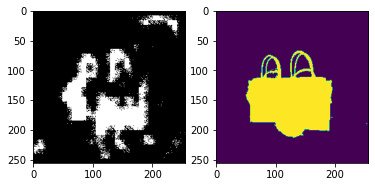

In [ ]:
softmax = torch.nn.Softmax(dim=1)


pred = softmax(pred)
pred.squeeze_()
pred = pred.argmax(dim=0)
pred = pred.cpu()
mask = mask.cpu()
Uio = torch.abs(pred - mask[0])
diff_count = Uio.unique(return_counts=True)
print(f'difference count is : {diff_count}')
pred[pred == 1] = 255

import matplotlib.pyplot as plt


fig = plt.figure()

plt.subplot(1, 2, 1)
plt.imshow(pred, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(mask[0])

IndexError: ignored

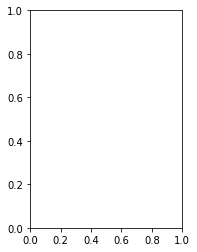

In [ ]:
fig = plt.figure()

plt.subplot(1, 2, 1)
plt.imshow(outputs_stacked['predictions'][104].reshape(256,256), cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(outputs_stacked['masks'][104].reshape(256,256))

In [ ]:
  # dict to store model predictions, provided masks and provided validatioin images
  
  outputs_stacked = {"predictions": np.empty((0, 256 * 256), int),
                     "masks": np.empty((0, 256 * 256), int),
                     "inputs": np.empty((0,3, 256 ,256), int)}

In [ ]:
# function which performs predictions and return a dict holding all predictions, also provided corresponding masks are added into it.

def predictions(dloader, modl):
  
  for img, lab in dloader:
    for img1, lab1 in zip(img, lab):
      img1.unsqueeze_(dim=0)
      if cuda:
        img1 = img1.cuda()
      output = modl(img1)
      output.cpu()
      softmax = torch.nn.Softmax(dim=1)
      output = softmax(output)
      output.squeeze_()
      output = output.argmax(dim=0)
      output = output.cpu()
      lab1 = lab1.cpu()
      output[output == 1] = 255
      outputs_stacked["predictions"]=np.append(outputs_stacked["predictions"],output.view(1, 256*256), axis=0)
      outputs_stacked["masks"] = np.append(outputs_stacked["masks"],lab1.view(1, 256*256), axis=0)
  return outputs_stacked


In [ ]:
# Once again loading the Validataion images (Without normalising) and saving it in the, dict so as to make it easy to plot it along with predictions

validation_transform = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()])
validation_dataset = BagsDataset(root='/content/bags_data', split='val', transform=validation_transform)
val_dataloader = DataLoader(validation_dataset, batch_size=8, num_workers=0)
#val_dataloader = np.array(val_dataloader)


for im, la in val_dataloader:
  im.cpu()
  outputs_stacked["inputs"] = np.append(outputs_stacked["inputs"],im, axis=0)

outputs_stacked["inputs"] = outputs_stacked["inputs"].transpose(0,2,3,1)
outputs_stacked["inputs"].shape

(107, 256, 256, 3)

In [ ]:


# fig = plt.figure()

# plt.subplot(1, 1, 1)
# dimch = outputs_stacked['inputs'][10].transpose(1,2,0)
# print(dimch.shape)
# dimch = dimch*255
# dimch = dimch.astype(np.int64)
# plt.imshow( (dimch))

(107, 256, 256, 3)

In [ ]:
dimch.shape

(256, 256, 3)

In [ ]:
# call to predictions function

predictions(val_dataloader, model_1)

In [ ]:
outputs_stacked["masks"].shape

(107, 65536)

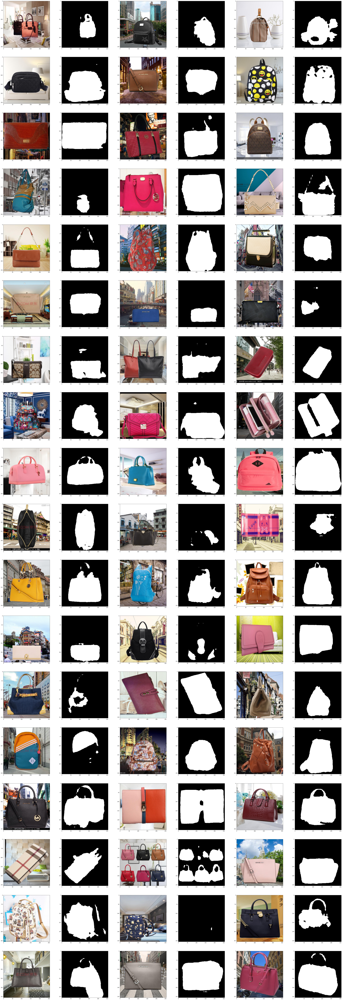

In [ ]:
import matplotlib.pyplot as plt
import math


fig = plt.figure(figsize=(60,180))
rows = math.ceil(outputs_stacked["masks"].shape[0] / 6)
cols = 6


for i in range(0, rows*cols,2):
  # for j in range(1, cols+1):
    if i > 106:
      break
    plt.subplot(rows, cols, i+1)
    plt.imshow(outputs_stacked["inputs"][i])
    plt.subplot(rows, cols, i+2)
    plt.imshow(outputs_stacked["predictions"][i].reshape(256,256), cmap="gray")
#plt.tight_layout()
#plt.axis('off')

plt.show()
    


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model_1 = torch.load('/content/drive/MyDrive/Bags Segmentation/model.pth')
model_1.eval()

FCN8s(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(100, 100))
  (relu1_1): ReLU(inplace=True)
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1_2): ReLU(inplace=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_1): ReLU(inplace=True)
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_2): ReLU(inplace=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_1): ReLU(inplace=True)
  (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_2): ReLU(inplace=True)
  (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_3): ReLU(inplace=True)
  (pool3): MaxPool2d(kernel_size=2

In [ ]:
# torch.save(model, '/content/model.pth')

In [ ]:
# state = {
#         'epoch': epoch,
#         'state_dict': model.state_dict(),
#         'optimizer': optimizer.state_dict(),
# }
# savepath='/content/model_complete.pth'
# torch.save(state,savepath)

In [ ]:
# pred = softmax(pred)

In [ ]:
# pred.shape

In [ ]:
# pred.squeeze_()
# pred.shape

In [ ]:
# pred = pred.argmax(dim=0)
# pred.shape

In [ ]:
# pred = pred.cpu()
# mask = mask.cpu()
# Uio = torch.abs(pred - mask[0])
# Uio.unique(return_counts=True)

In [ ]:
# pred[pred == 1] = 255
# pred.unique()

In [ ]:
# import matplotlib.pyplot as plt
# pred =pred.cpu()
# plt.imshow(pred, cmap="gray")

In [ ]:
# plt.imshow(mask[0])